In [1]:
import pandas as pd
import numpy as np
import plotly
import plotly.graph_objs as go
from plotly.offline import iplot
from varname import nameof
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
def plot_confusion_matrix(cm,
                          target_names,
                          title='Confusion matrix',
                          cmap=None,
                          normalize=True):

    accuracy = np.trace(cm) / np.sum(cm).astype('float')
    misclass = 1 - accuracy

    if cmap is None:
        cmap = plt.get_cmap('Reds')

    plt.figure(figsize=(10, 8))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title,fontsize=15)
    plt.colorbar()

    if target_names is not None:
        tick_marks = np.arange(len(target_names))
        plt.xticks(tick_marks, target_names, rotation=45, fontsize=15)
        plt.yticks(tick_marks, target_names, fontsize=15)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]


    thresh = cm.max() / 1.1 if normalize else cm.max() / 2
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        if normalize:
            plt.text(j, i, f'{cm[i, j]:.4f}',
                     horizontalalignment='center',
                     color='white' if cm[i, j] > thresh else 'black',
                    fontsize=15)
        else:
            plt.text(j, i, f'{cm[i, j]:,}',
                     horizontalalignment='center',
                     color='white' if cm[i, j] > thresh else 'black',
                    fontsize=15)


    plt.tight_layout()
    plt.ylabel('True label',fontsize=15)
    plt.xlabel(f'Predicted label\n\nAccuracy={accuracy:0.4f}; Misclass={misclass:0.4f}', fontsize=15)
    plt.show()


# Load data

In [3]:
pd.set_option('display.max_columns', 40)
df = pd.read_csv(r'C:\Users\user\DeepLearningProjects\League of Legends\high_diamond_ranked_10min.csv')
df

,gameId,blueWins,blueWardsPlaced,blueWardsDestroyed,blueFirstBlood,blueKills,blueDeaths,blueAssists,blueEliteMonsters,blueDragons,blueHeralds,blueTowersDestroyed,blueTotalGold,blueAvgLevel,blueTotalExperience,blueTotalMinionsKilled,blueTotalJungleMinionsKilled,blueGoldDiff,blueExperienceDiff,blueCSPerMin,blueGoldPerMin,redWardsPlaced,redWardsDestroyed,redFirstBlood,redKills,redDeaths,redAssists,redEliteMonsters,redDragons,redHeralds,redTowersDestroyed,redTotalGold,redAvgLevel,redTotalExperience,redTotalMinionsKilled,redTotalJungleMinionsKilled,redGoldDiff,redExperienceDiff,redCSPerMin,redGoldPerMin
0,4519157822,0,28,2,1,9,6,11,0,0,0,0,17210,6.6,17039,195,36,643,-8,19.5,1721.0,15,6,0,6,9,8,0,0,0,0,16567,6.8,17047,197,55,-643,8,19.7,1656.7
1,4523371949,0,12,1,0,5,5,5,0,0,0,0,14712,6.6,16265,174,43,-2908,-1173,17.4,1471.2,12,1,1,5,5,2,2,1,1,1,17620,6.8,17438,240,52,2908,1173,24.0,1762.0
2,4521474530,0,15,0,0,7,11,4,1,1,0,0,16113,6.4,16221,186,46,-1172,-1033,18.6,1611.3,15,3,1,11,7,14,0,0,0,0,17285,6.8,17254,203,28,1172,1033,20.3,1728.5
3,4524384067,0,43,1,0,4,5,5,1,0,1,0,15157,7.0,17954,201,55,-1321,-7,20.1,1515.7,15,2,1,5,4,10,0,0,0,0,16478,7.0,17961,235,47,1321,7,23.5,1647.8
4,4436033771,0,75,4,0,6,6,6,0,0,0,0,16400,7.0,18543,210,57,-1004,230,21.0,1640.0,17,2,1,6,6,7,1,1,0,0,17404,7.0,18313,225,67,1004,-230,22.5,1740.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9874,4527873286,1,17,2,1,7,4,5,1,1,0,0,17765,7.2,18967,211,69,2519,2469,21.1,1776.5,46,3,0,4,7,7,0,0,0,0,15246,6.8,16498,229,34,-2519,-2469,22.9,1524.6
9875,4527797466,1,54,0,0,6,4,8,1,1,0,0,16238,7.2,19255,233,48,782,888,23.3,1623.8,12,21,1,4,6,3,0,0,0,0,15456,7.0,18367,206,56,-782,-888,20.6,1545.6
9876,4527713716,0,23,1,0,6,7,5,0,0,0,0,15903,7.0,18032,210,45,-2416,-1877,21.0,1590.3,14,0,1,7,6,11,1,1,0,0,18319,7.4,19909,261,60,2416,1877,26.1,1831.9
9877,4527628313,0,14,4,1,2,3,3,1,1,0,0,14459,6.6,17229,224,48,-839,-1085,22.4,1445.9,66,4,0,3,2,1,0,0,0,0,15298,7.2,18314,247,40,839,1085,24.7,1529.8


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9879 entries, 0 to 9878
Data columns (total 40 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   gameId                        9879 non-null   int64  
 1   blueWins                      9879 non-null   int64  
 2   blueWardsPlaced               9879 non-null   int64  
 3   blueWardsDestroyed            9879 non-null   int64  
 4   blueFirstBlood                9879 non-null   int64  
 5   blueKills                     9879 non-null   int64  
 6   blueDeaths                    9879 non-null   int64  
 7   blueAssists                   9879 non-null   int64  
 8   blueEliteMonsters             9879 non-null   int64  
 9   blueDragons                   9879 non-null   int64  
 10  blueHeralds                   9879 non-null   int64  
 11  blueTowersDestroyed           9879 non-null   int64  
 12  blueTotalGold                 9879 non-null   int64  
 13  blu

In [5]:
df.describe()

,gameId,blueWins,blueWardsPlaced,blueWardsDestroyed,blueFirstBlood,blueKills,blueDeaths,blueAssists,blueEliteMonsters,blueDragons,blueHeralds,blueTowersDestroyed,blueTotalGold,blueAvgLevel,blueTotalExperience,blueTotalMinionsKilled,blueTotalJungleMinionsKilled,blueGoldDiff,blueExperienceDiff,blueCSPerMin,blueGoldPerMin,redWardsPlaced,redWardsDestroyed,redFirstBlood,redKills,redDeaths,redAssists,redEliteMonsters,redDragons,redHeralds,redTowersDestroyed,redTotalGold,redAvgLevel,redTotalExperience,redTotalMinionsKilled,redTotalJungleMinionsKilled,redGoldDiff,redExperienceDiff,redCSPerMin,redGoldPerMin
count,9.879000e+03,9879.000000,9879.000000,9879.000000,9879.000000,9879.000000,9879.000000,9879.000000,9879.000000,9879.000000,9879.000000,9879.000000,9879.000000,9879.000000,9879.000000,9879.000000,9879.000000,9879.000000,9879.000000,9879.000000,9879.000000,9879.000000,9879.000000,9879.000000,9879.000000,9879.000000,9879.000000,9879.000000,9879.000000,9879.000000,9879.000000,9879.000000,9879.000000,9879.000000,9879.000000,9879.000000,9879.000000,9879.000000,9879.000000,9879.000000
mean,4.500084e+09,0.499038,22.288288,2.824881,0.504808,6.183925,6.137666,6.645106,0.549954,0.361980,0.187974,0.051422,16503.455512,6.916004,17928.110133,216.699565,50.509667,14.414111,-33.620306,21.669956,1650.345551,22.367952,2.723150,0.495192,6.137666,6.183925,6.662112,0.573135,0.413098,0.160036,0.043021,16489.041401,6.925316,17961.730438,217.349226,51.313088,-14.414111,33.620306,21.734923,1648.904140
std,2.757328e+07,0.500024,18.019177,2.174998,0.500002,3.011028,2.933818,4.064520,0.625527,0.480597,0.390712,0.244369,1535.446636,0.305146,1200.523764,21.858437,9.898282,2453.349179,1920.370438,2.185844,153.544664,18.457427,2.138356,0.500002,2.933818,3.011028,4.060612,0.626482,0.492415,0.366658,0.216900,1490.888406,0.305311,1198.583912,21.911668,10.027885,2453.349179,1920.370438,2.191167,149.088841
min,4.295358e+09,0.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,10730.000000,4.600000,10098.000000,90.000000,0.000000,-10830.000000,-9333.000000,9.000000,1073.000000,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,11212.000000,4.800000,10465.000000,107.000000,4.000000,-11467.000000,-8348.000000,10.700000,1121.200000
25%,4.483301e+09,0.000000,14.000000,1.000000,0.000000,4.000000,4.000000,4.000000,0.000000,0.000000,0.000000,0.000000,15415.500000,6.800000,17168.000000,202.000000,44.000000,-1585.500000,-1290.500000,20.200000,1541.550000,14.000000,1.000000,0.000000,4.000000,4.000000,4.000000,0.000000,0.000000,0.000000,0.000000,15427.500000,6.800000,17209.500000,203.000000,44.000000,-1596.000000,-1212.000000,20.300000,1542.750000
50%,4.510920e+09,0.000000,16.000000,3.000000,1.000000,6.000000,6.000000,6.000000,0.000000,0.000000,0.000000,0.000000,16398.000000,7.000000,17951.000000,218.000000,50.000000,14.000000,-28.000000,21.800000,1639.800000,16.000000,2.000000,0.000000,6.000000,6.000000,6.000000,0.000000,0.000000,0.000000,0.000000,16378.000000,7.000000,17974.000000,218.000000,51.000000,-14.000000,28.000000,21.800000,1637.800000
75%,4.521733e+09,1.000000,20.000000,4.000000,1.000000,8.000000,8.000000,9.000000,1.000000,1.000000,0.000000,0.000000,17459.000000,7.200000,18724.000000,232.000000,56.000000,1596.000000,1212.000000,23.200000,1745.900000,20.000000,4.000000,1.000000,8.000000,8.000000,9.000000,1.000000,1.000000,0.000000,0.000000,17418.500000,7.200000,18764.500000,233.000000,57.000000,1585.500000,1290.500000,23.300000,1741.850000
max,4.527991e+09,1.000000,250.000000,27.000000,1.000000,22.000000,22.000000,29.000000,2.000000,1.000000,1.000000,4.000000,23701.000000,8.000000,22224.000000,283.000000,92.000000,11467.000000,8348.000000,28.300000,2370.100000,276.000000,24.000000,1.000000,22.000000,22.000000,28.000000,2.000000,1.000000,1.000000,2.000000,22732.000000,8.200000,22269.000000,289.000000,92.000000,10830.000000,9333.000000,28.900000,2273.200000


In [6]:
filt = df['blueWins']==0
for i in range(2,df.shape[1]):
    trace = go.Histogram(x=df[filt][df.columns[i]],
                        marker_color='rgba(255,0,0,0.9)',
                        name='Game won by Red')
    trace1 = go.Histogram(x=df[~filt][df.columns[i]],
                         marker_color='rgba(0,0,255,0.9)',
                         name='Game won by Blue')
    fig = go.Figure(data=[trace, trace1], layout=go.Layout(title=go.layout.Title(text=f'{df.columns[i]}')))
    iplot(fig)

# Data preparation

In [7]:
y = df['blueWins']

df.drop(columns=['gameId', 'redFirstBlood', 'redKills', 'redDeaths', 
                 'redGoldDiff', 'redExperienceDiff'], inplace=True)
df.head(10)

,blueWins,blueWardsPlaced,blueWardsDestroyed,blueFirstBlood,blueKills,blueDeaths,blueAssists,blueEliteMonsters,blueDragons,blueHeralds,blueTowersDestroyed,blueTotalGold,blueAvgLevel,blueTotalExperience,blueTotalMinionsKilled,blueTotalJungleMinionsKilled,blueGoldDiff,blueExperienceDiff,blueCSPerMin,blueGoldPerMin,redWardsPlaced,redWardsDestroyed,redAssists,redEliteMonsters,redDragons,redHeralds,redTowersDestroyed,redTotalGold,redAvgLevel,redTotalExperience,redTotalMinionsKilled,redTotalJungleMinionsKilled,redCSPerMin,redGoldPerMin
0,0,28,2,1,9,6,11,0,0,0,0,17210,6.6,17039,195,36,643,-8,19.5,1721.0,15,6,8,0,0,0,0,16567,6.8,17047,197,55,19.7,1656.7
1,0,12,1,0,5,5,5,0,0,0,0,14712,6.6,16265,174,43,-2908,-1173,17.4,1471.2,12,1,2,2,1,1,1,17620,6.8,17438,240,52,24.0,1762.0
2,0,15,0,0,7,11,4,1,1,0,0,16113,6.4,16221,186,46,-1172,-1033,18.6,1611.3,15,3,14,0,0,0,0,17285,6.8,17254,203,28,20.3,1728.5
3,0,43,1,0,4,5,5,1,0,1,0,15157,7.0,17954,201,55,-1321,-7,20.1,1515.7,15,2,10,0,0,0,0,16478,7.0,17961,235,47,23.5,1647.8
4,0,75,4,0,6,6,6,0,0,0,0,16400,7.0,18543,210,57,-1004,230,21.0,1640.0,17,2,7,1,1,0,0,17404,7.0,18313,225,67,22.5,1740.4
5,1,18,0,0,5,3,6,1,1,0,0,15899,7.0,18161,225,42,698,101,22.5,1589.9,36,5,2,0,0,0,0,15201,7.0,18060,221,59,22.1,1520.1
6,1,18,3,1,7,6,7,1,1,0,0,16874,6.8,16967,225,53,2411,1563,22.5,1687.4,57,1,9,0,0,0,0,14463,6.4,15404,164,35,16.4,1446.3
7,0,16,2,0,5,13,3,0,0,0,0,15305,6.4,16138,209,48,-2615,-800,20.9,1530.5,15,0,11,1,1,0,0,17920,6.6,16938,157,54,15.7,1792.0
8,0,16,3,0,7,7,8,0,0,0,0,16401,7.2,18527,189,61,-1979,-771,18.9,1640.1,15,2,5,2,1,1,0,18380,7.2,19298,240,53,24.0,1838.0
9,1,13,1,1,4,5,5,1,1,0,0,15057,6.8,16805,220,39,-1548,-1574,22.0,1505.7,16,2,4,0,0,0,0,16605,6.8,18379,247,43,24.7,1660.5


In [8]:
from sklearn import preprocessing

df_scaled = pd.DataFrame(preprocessing.MinMaxScaler().fit(df).transform(df), columns=df.columns)
df_scaled['blueWins'] = df_scaled['blueWins'].astype(int)
df_scaled

,blueWins,blueWardsPlaced,blueWardsDestroyed,blueFirstBlood,blueKills,blueDeaths,blueAssists,blueEliteMonsters,blueDragons,blueHeralds,blueTowersDestroyed,blueTotalGold,blueAvgLevel,blueTotalExperience,blueTotalMinionsKilled,blueTotalJungleMinionsKilled,blueGoldDiff,blueExperienceDiff,blueCSPerMin,blueGoldPerMin,redWardsPlaced,redWardsDestroyed,redAssists,redEliteMonsters,redDragons,redHeralds,redTowersDestroyed,redTotalGold,redAvgLevel,redTotalExperience,redTotalMinionsKilled,redTotalJungleMinionsKilled,redCSPerMin,redGoldPerMin
0,0,0.093878,0.074074,1.0,0.409091,0.272727,0.379310,0.0,0.0,0.0,0.0,0.499576,0.588235,0.572406,0.544041,0.391304,0.514554,0.527402,0.544041,0.499576,0.033333,0.250000,0.285714,0.0,0.0,0.0,0.0,0.464844,0.588235,0.557608,0.494505,0.579545,0.494505,0.464844
1,0,0.028571,0.037037,0.0,0.227273,0.227273,0.172414,0.0,0.0,0.0,0.0,0.306993,0.588235,0.508577,0.435233,0.467391,0.355294,0.461512,0.435233,0.306993,0.022222,0.041667,0.071429,1.0,1.0,1.0,0.5,0.556250,0.588235,0.590732,0.730769,0.545455,0.730769,0.556250
2,0,0.040816,0.000000,0.0,0.318182,0.500000,0.137931,0.5,1.0,0.0,0.0,0.415003,0.529412,0.504948,0.497409,0.500000,0.433152,0.469430,0.497409,0.415003,0.033333,0.125000,0.500000,0.0,0.0,0.0,0.0,0.527170,0.588235,0.575144,0.527473,0.272727,0.527473,0.527170
3,0,0.155102,0.037037,0.0,0.181818,0.227273,0.172414,0.5,0.0,1.0,0.0,0.341300,0.705882,0.647864,0.575130,0.597826,0.426470,0.527459,0.575130,0.341300,0.033333,0.083333,0.357143,0.0,0.0,0.0,0.0,0.457118,0.647059,0.635039,0.703297,0.488636,0.703297,0.457118
4,0,0.285714,0.148148,0.0,0.272727,0.272727,0.206897,0.0,0.0,0.0,0.0,0.437129,0.705882,0.696437,0.621762,0.619565,0.440687,0.540863,0.621762,0.437129,0.040741,0.083333,0.250000,0.5,1.0,0.0,0.0,0.537500,0.647059,0.664859,0.648352,0.715909,0.648352,0.537500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9874,1,0.048980,0.074074,1.0,0.318182,0.181818,0.172414,0.5,1.0,0.0,0.0,0.542364,0.764706,0.731404,0.626943,0.750000,0.598690,0.667496,0.626943,0.542364,0.148148,0.125000,0.250000,0.0,0.0,0.0,0.0,0.350174,0.588235,0.511098,0.670330,0.340909,0.670330,0.350174
9875,1,0.200000,0.000000,0.0,0.272727,0.181818,0.275862,0.5,1.0,0.0,0.0,0.424640,0.764706,0.755154,0.740933,0.521739,0.520788,0.578078,0.740933,0.424640,0.022222,0.875000,0.107143,0.0,0.0,0.0,0.0,0.368403,0.647059,0.669434,0.543956,0.590909,0.543956,0.368403
9876,0,0.073469,0.037037,0.0,0.272727,0.318182,0.172414,0.0,0.0,0.0,0.0,0.398813,0.705882,0.654297,0.621762,0.489130,0.377360,0.421696,0.621762,0.398813,0.029630,0.000000,0.392857,0.5,1.0,0.0,0.0,0.616927,0.764706,0.800068,0.846154,0.636364,0.846154,0.616927
9877,0,0.036735,0.148148,1.0,0.090909,0.136364,0.103448,0.5,1.0,0.0,0.0,0.287487,0.588235,0.588075,0.694301,0.521739,0.448087,0.466489,0.694301,0.287487,0.222222,0.166667,0.035714,0.0,0.0,0.0,0.0,0.354688,0.705882,0.664944,0.769231,0.409091,0.769231,0.354688


## d Cohens effect size

In [9]:
from statistics import mean, stdev
from math import sqrt



effects=[]
for column in range(1, df.shape[1]):
    c0 = df.iloc[:,column][filt].tolist()
    c1 = df.iloc[:,column][~filt].tolist()
    mianownik = (sqrt(((len(c0)-1)*stdev(c0) ** 2 + (len(c1)-1)*stdev(c1) ** 2) / len(c0)+len(c1)-2))
    cohens_d = abs((mean(c0) - mean(c1)) / mianownik)
    effects.append([round(cohens_d,3),df.columns[column]])

effects.sort(reverse=True)

print(effects)

[[0.842, 'blueGoldDiff'], [0.794, 'blueExperienceDiff'], [0.649, 'blueTotalGold'], [0.639, 'redTotalGold'], [0.612, 'blueGoldPerMin'], [0.61, 'blueTotalExperience'], [0.6, 'redGoldPerMin'], [0.595, 'redTotalExperience'], [0.129, 'blueTotalMinionsKilled'], [0.122, 'redTotalMinionsKilled'], [0.036, 'blueTotalJungleMinionsKilled'], [0.032, 'blueAssists'], [0.031, 'redTotalJungleMinionsKilled'], [0.031, 'redAssists'], [0.029, 'blueKills'], [0.028, 'blueDeaths'], [0.014, 'blueCSPerMin'], [0.013, 'redCSPerMin'], [0.012, 'redWardsPlaced'], [0.004, 'redEliteMonsters'], [0.004, 'blueEliteMonsters'], [0.003, 'redWardsDestroyed'], [0.003, 'redDragons'], [0.003, 'redAvgLevel'], [0.003, 'blueWardsDestroyed'], [0.003, 'blueFirstBlood'], [0.003, 'blueDragons'], [0.003, 'blueAvgLevel'], [0.001, 'redTowersDestroyed'], [0.001, 'redHeralds'], [0.001, 'blueTowersDestroyed'], [0.001, 'blueHeralds'], [0.0, 'blueWardsPlaced']]


In [10]:
df_scaled_cohen = df_scaled[['blueGoldDiff', 'blueExperienceDiff', 'blueTotalGold', 'redTotalGold', 
                             'blueGoldPerMin', 'blueTotalExperience', 'redGoldPerMin', 'redTotalExperience']]
df_scaled_cohen

,blueGoldDiff,blueExperienceDiff,blueTotalGold,redTotalGold,blueGoldPerMin,blueTotalExperience,redGoldPerMin,redTotalExperience
0,0.514554,0.527402,0.499576,0.464844,0.499576,0.572406,0.464844,0.557608
1,0.355294,0.461512,0.306993,0.556250,0.306993,0.508577,0.556250,0.590732
2,0.433152,0.469430,0.415003,0.527170,0.415003,0.504948,0.527170,0.575144
3,0.426470,0.527459,0.341300,0.457118,0.341300,0.647864,0.457118,0.635039
4,0.440687,0.540863,0.437129,0.537500,0.437129,0.696437,0.537500,0.664859
...,...,...,...,...,...,...,...,...
9874,0.598690,0.667496,0.542364,0.350174,0.542364,0.731404,0.350174,0.511098
9875,0.520788,0.578078,0.424640,0.368403,0.424640,0.755154,0.368403,0.669434
9876,0.377360,0.421696,0.398813,0.616927,0.398813,0.654297,0.616927,0.800068
9877,0.448087,0.466489,0.287487,0.354688,0.287487,0.588075,0.354688,0.664944


## Correlation matrix

In [11]:
corr_matrix = df_scaled.corr()


trace = go.Heatmap(z=corr_matrix,
                  x=df_scaled.columns,
                  y=df_scaled.columns)

layout = go.Layout(title=go.layout.Title(text='Correlation heatmap', x=0.50, font_size=25),
                   margin=go.layout.Margin(l=0, r=0, t=40, b=10))

fig = go.Figure(data=trace, layout=layout)
iplot(fig)

In [12]:
corr_matrix['blueWins'][(corr_matrix['blueWins']<(-0.4))|(corr_matrix['blueWins']>(0.4))]

blueWins              1.000000
blueTotalGold         0.417213
blueGoldDiff          0.511119
blueExperienceDiff    0.489558
blueGoldPerMin        0.417213
redTotalGold         -0.411396
redGoldPerMin        -0.411396
Name: blueWins, dtype: float64

In [13]:
df_scaled_corr = df_scaled[['blueTotalGold','blueGoldDiff', 'blueExperienceDiff', 'blueGoldPerMin', 
                            'redTotalGold', 'redGoldPerMin']]
df_scaled_corr

,blueTotalGold,blueGoldDiff,blueExperienceDiff,blueGoldPerMin,redTotalGold,redGoldPerMin
0,0.499576,0.514554,0.527402,0.499576,0.464844,0.464844
1,0.306993,0.355294,0.461512,0.306993,0.556250,0.556250
2,0.415003,0.433152,0.469430,0.415003,0.527170,0.527170
3,0.341300,0.426470,0.527459,0.341300,0.457118,0.457118
4,0.437129,0.440687,0.540863,0.437129,0.537500,0.537500
...,...,...,...,...,...,...
9874,0.542364,0.598690,0.667496,0.542364,0.350174,0.350174
9875,0.424640,0.520788,0.578078,0.424640,0.368403,0.368403
9876,0.398813,0.377360,0.421696,0.398813,0.616927,0.616927
9877,0.287487,0.448087,0.466489,0.287487,0.354688,0.354688


## K best and chisquare

In [14]:
# Import SelectKBest and Chisquare from Scikit Learn feature selection
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

X = df_scaled.drop(['blueWins'],axis=1)
y = df_scaled['blueWins']

# Leverage SelectKBest class to extract the top 9 best features
bestfeatures = SelectKBest(score_func=chi2, k=5)
fit = bestfeatures.fit(X,y)
df_scores = pd.DataFrame({'Score':fit.scores_, 
                               'Feature':X.columns})

# Display the 5 best features 
print(df_scores.nlargest(5,'Score'))

         Score            Feature
7   288.025837        blueDragons
23  254.514302         redDragons
2   199.157410     blueFirstBlood
6   173.097707  blueEliteMonsters
22  166.014728   redEliteMonsters


In [15]:
df_scaled_kbest = df_scaled[['blueDragons', 'redDragons', 'blueFirstBlood', 'blueEliteMonsters', 'redEliteMonsters']]
df_scaled_kbest

,blueDragons,redDragons,blueFirstBlood,blueEliteMonsters,redEliteMonsters
0,0.0,0.0,1.0,0.0,0.0
1,0.0,1.0,0.0,0.0,1.0
2,1.0,0.0,0.0,0.5,0.0
3,0.0,0.0,0.0,0.5,0.0
4,0.0,1.0,0.0,0.0,0.5
...,...,...,...,...,...
9874,1.0,0.0,1.0,0.5,0.0
9875,1.0,0.0,0.0,0.5,0.0
9876,0.0,1.0,0.0,0.0,0.5
9877,1.0,0.0,1.0,0.5,0.0


# Classification

In [16]:
df_scaled.drop(columns=['blueWins'], inplace=True)
datasets = [df_scaled, df_scaled_cohen, df_scaled_corr, df_scaled_kbest]
df_scaled

,blueWardsPlaced,blueWardsDestroyed,blueFirstBlood,blueKills,blueDeaths,blueAssists,blueEliteMonsters,blueDragons,blueHeralds,blueTowersDestroyed,blueTotalGold,blueAvgLevel,blueTotalExperience,blueTotalMinionsKilled,blueTotalJungleMinionsKilled,blueGoldDiff,blueExperienceDiff,blueCSPerMin,blueGoldPerMin,redWardsPlaced,redWardsDestroyed,redAssists,redEliteMonsters,redDragons,redHeralds,redTowersDestroyed,redTotalGold,redAvgLevel,redTotalExperience,redTotalMinionsKilled,redTotalJungleMinionsKilled,redCSPerMin,redGoldPerMin
0,0.093878,0.074074,1.0,0.409091,0.272727,0.379310,0.0,0.0,0.0,0.0,0.499576,0.588235,0.572406,0.544041,0.391304,0.514554,0.527402,0.544041,0.499576,0.033333,0.250000,0.285714,0.0,0.0,0.0,0.0,0.464844,0.588235,0.557608,0.494505,0.579545,0.494505,0.464844
1,0.028571,0.037037,0.0,0.227273,0.227273,0.172414,0.0,0.0,0.0,0.0,0.306993,0.588235,0.508577,0.435233,0.467391,0.355294,0.461512,0.435233,0.306993,0.022222,0.041667,0.071429,1.0,1.0,1.0,0.5,0.556250,0.588235,0.590732,0.730769,0.545455,0.730769,0.556250
2,0.040816,0.000000,0.0,0.318182,0.500000,0.137931,0.5,1.0,0.0,0.0,0.415003,0.529412,0.504948,0.497409,0.500000,0.433152,0.469430,0.497409,0.415003,0.033333,0.125000,0.500000,0.0,0.0,0.0,0.0,0.527170,0.588235,0.575144,0.527473,0.272727,0.527473,0.527170
3,0.155102,0.037037,0.0,0.181818,0.227273,0.172414,0.5,0.0,1.0,0.0,0.341300,0.705882,0.647864,0.575130,0.597826,0.426470,0.527459,0.575130,0.341300,0.033333,0.083333,0.357143,0.0,0.0,0.0,0.0,0.457118,0.647059,0.635039,0.703297,0.488636,0.703297,0.457118
4,0.285714,0.148148,0.0,0.272727,0.272727,0.206897,0.0,0.0,0.0,0.0,0.437129,0.705882,0.696437,0.621762,0.619565,0.440687,0.540863,0.621762,0.437129,0.040741,0.083333,0.250000,0.5,1.0,0.0,0.0,0.537500,0.647059,0.664859,0.648352,0.715909,0.648352,0.537500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9874,0.048980,0.074074,1.0,0.318182,0.181818,0.172414,0.5,1.0,0.0,0.0,0.542364,0.764706,0.731404,0.626943,0.750000,0.598690,0.667496,0.626943,0.542364,0.148148,0.125000,0.250000,0.0,0.0,0.0,0.0,0.350174,0.588235,0.511098,0.670330,0.340909,0.670330,0.350174
9875,0.200000,0.000000,0.0,0.272727,0.181818,0.275862,0.5,1.0,0.0,0.0,0.424640,0.764706,0.755154,0.740933,0.521739,0.520788,0.578078,0.740933,0.424640,0.022222,0.875000,0.107143,0.0,0.0,0.0,0.0,0.368403,0.647059,0.669434,0.543956,0.590909,0.543956,0.368403
9876,0.073469,0.037037,0.0,0.272727,0.318182,0.172414,0.0,0.0,0.0,0.0,0.398813,0.705882,0.654297,0.621762,0.489130,0.377360,0.421696,0.621762,0.398813,0.029630,0.000000,0.392857,0.5,1.0,0.0,0.0,0.616927,0.764706,0.800068,0.846154,0.636364,0.846154,0.616927
9877,0.036735,0.148148,1.0,0.090909,0.136364,0.103448,0.5,1.0,0.0,0.0,0.287487,0.588235,0.588075,0.694301,0.521739,0.448087,0.466489,0.694301,0.287487,0.222222,0.166667,0.035714,0.0,0.0,0.0,0.0,0.354688,0.705882,0.664944,0.769231,0.409091,0.769231,0.354688


In [17]:
scores_overall = []

### Decision Tree Classifier

Decision Tree Classifier for 1. dataset Accuracy:0.637(+/-0.016).


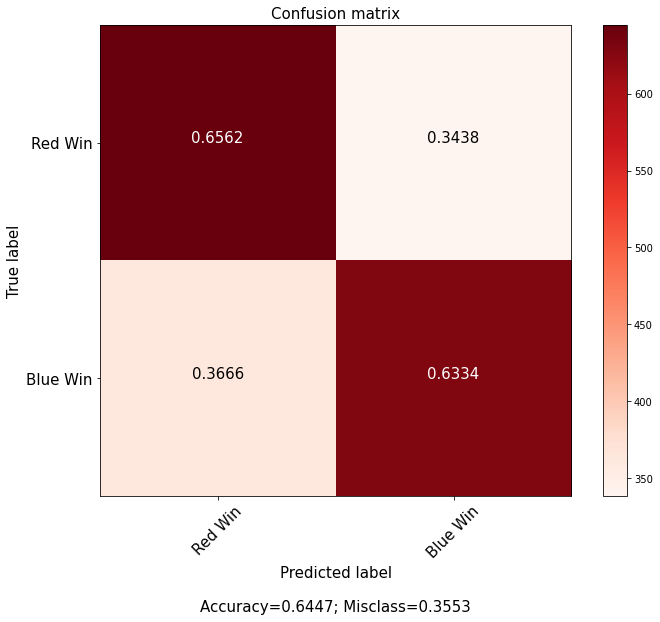

Decision Tree Classifier for 2. dataset Accuracy:0.640(+/-0.024).


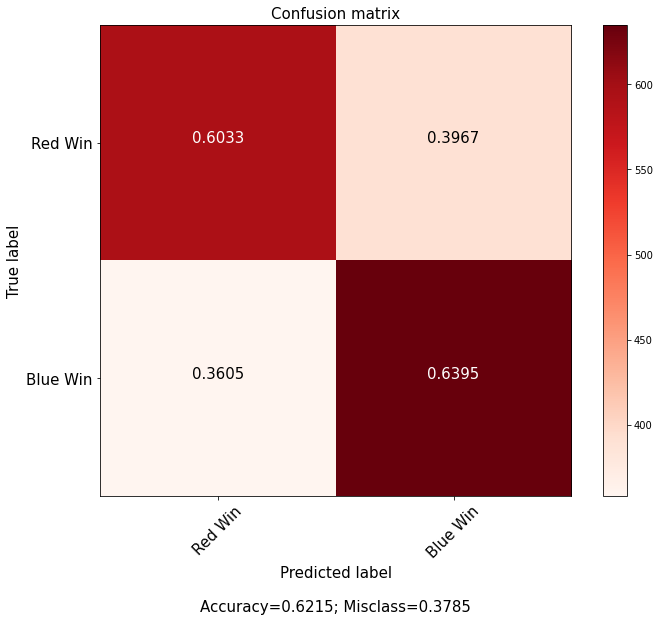

Decision Tree Classifier for 3. dataset Accuracy:0.642(+/-0.022).


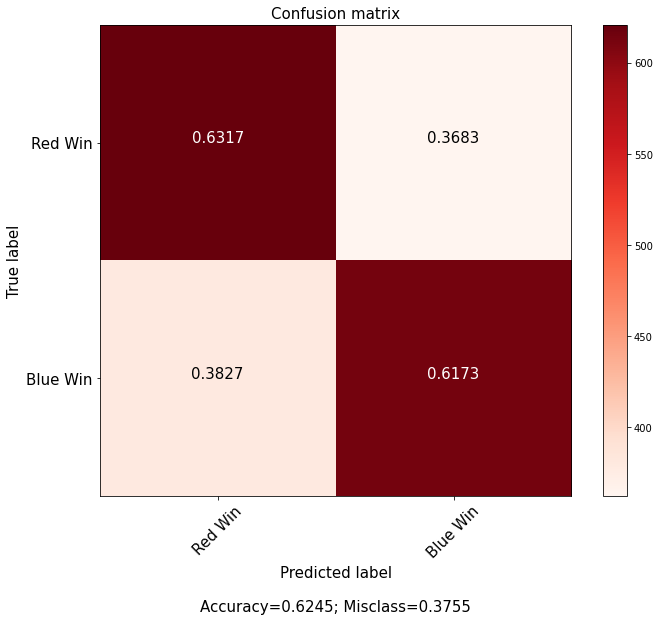

Decision Tree Classifier for 4. dataset Accuracy:0.628(+/-0.010).


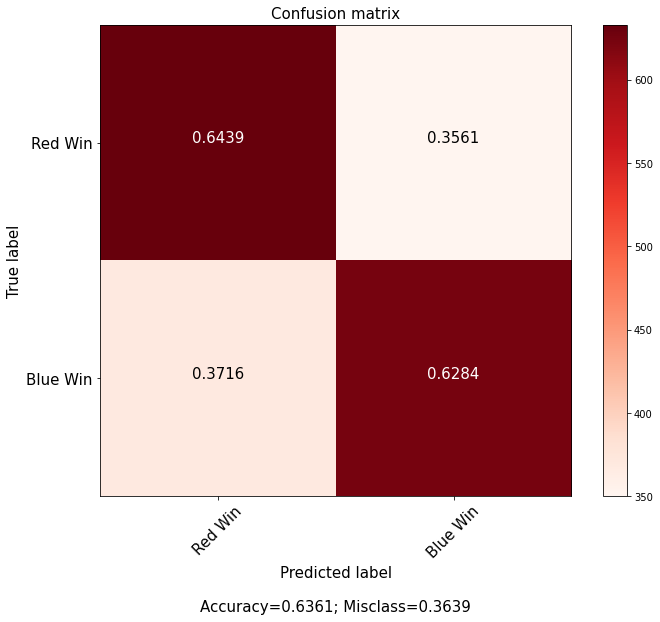

In [18]:
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix
import seaborn as sns
import itertools
from sklearn import tree

scores_model = []
for X in range(len(datasets)):  
    model = tree.DecisionTreeClassifier(criterion='entropy')
    scores = cross_val_score(model, datasets[X], y, cv=5)
    scores_model.append(round(scores.mean(),3))
    print(f'Decision Tree Classifier for {X+1}. dataset Accuracy:{scores.mean():.3f}(+/-{scores.std() * 2:.3f}).')
    
    X_train, X_test, y_train, y_test = train_test_split(datasets[X], y, test_size=0.2, random_state=42)

    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    labels = ['Red Win', 'Blue Win']
#     cm = confusion_matrix(realvpred['y_real'].values, realvpred['y_pred'].values)
    cm = confusion_matrix(y_test, y_pred)
    plot_confusion_matrix(cm, labels, title='Confusion matrix', cmap=None, normalize=True)
    
scores_overall.append(scores_model)

### Random Forest Classifier

Random Forest Classifier for 1. dataset Accuracy:0.695(+/-0.015).


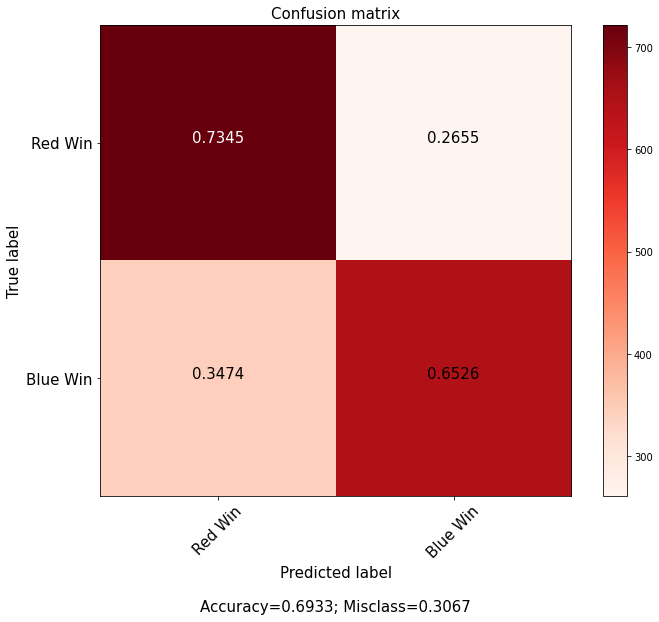

Random Forest Classifier for 2. dataset Accuracy:0.687(+/-0.016).


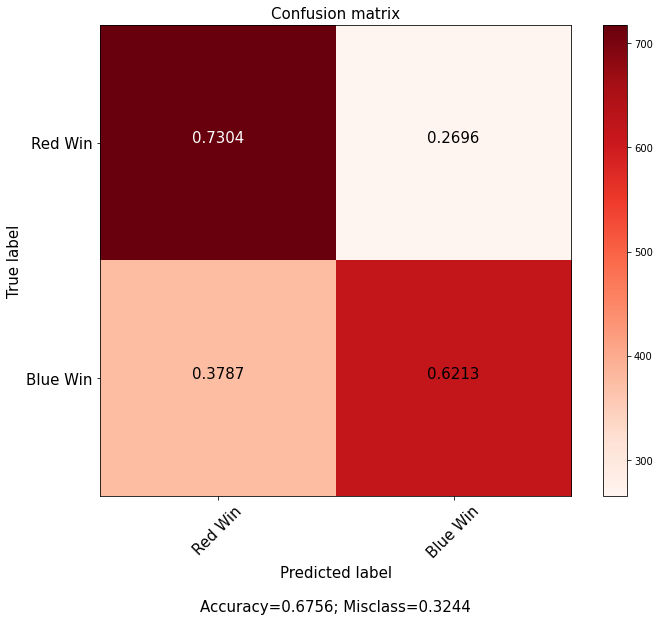

Random Forest Classifier for 3. dataset Accuracy:0.686(+/-0.012).


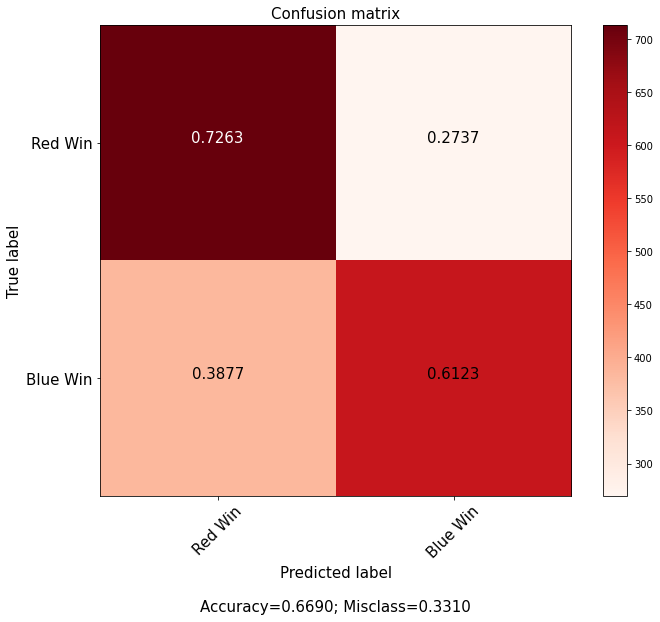

Random Forest Classifier for 4. dataset Accuracy:0.628(+/-0.010).


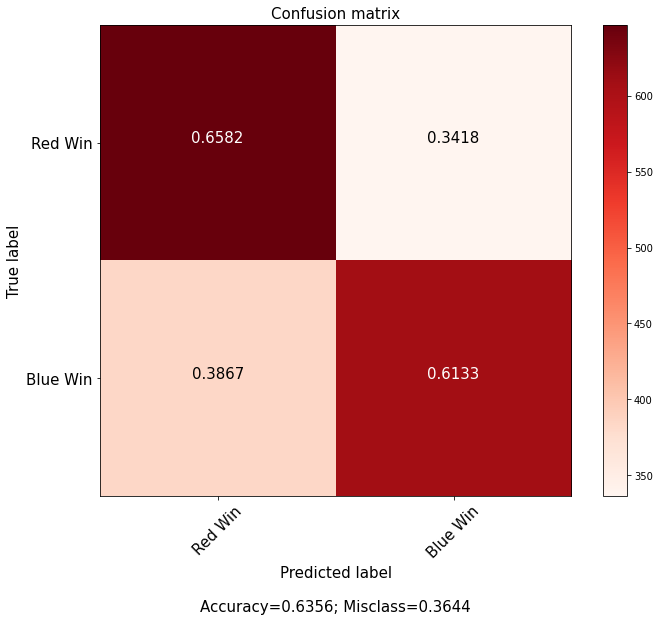

In [19]:
from sklearn.ensemble import RandomForestClassifier

scores_model = []
for X in range(len(datasets)):  
    model = RandomForestClassifier(n_estimators=10)
    scores = cross_val_score(model, datasets[X], y, cv=5)
    scores_model.append(round(scores.mean(),3))
    print(f'Random Forest Classifier for {X+1}. dataset Accuracy:{scores.mean():.3f}(+/-{scores.std() * 2:.3f}).')

    X_train, X_test, y_train, y_test = train_test_split(datasets[X], y, test_size=0.2, random_state=42)
    
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    labels = ['Red Win', 'Blue Win']
#     cm = confusion_matrix(realvpred['y_real'].values, realvpred['y_pred'].values)
    cm = confusion_matrix(y_test, y_pred)
    plot_confusion_matrix(cm, labels, title='Confusion matrix', cmap=None, normalize=True)
    
scores_overall.append(scores_model)

### Gaussian Naive Bayes

Gaussian Naive Bayes for 1. dataset Accuracy:0.726(+/-0.013).


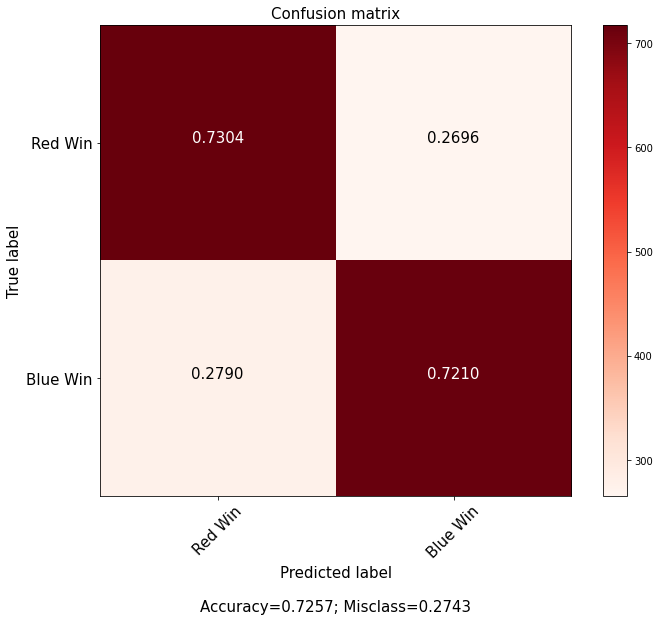

Gaussian Naive Bayes for 2. dataset Accuracy:0.728(+/-0.016).


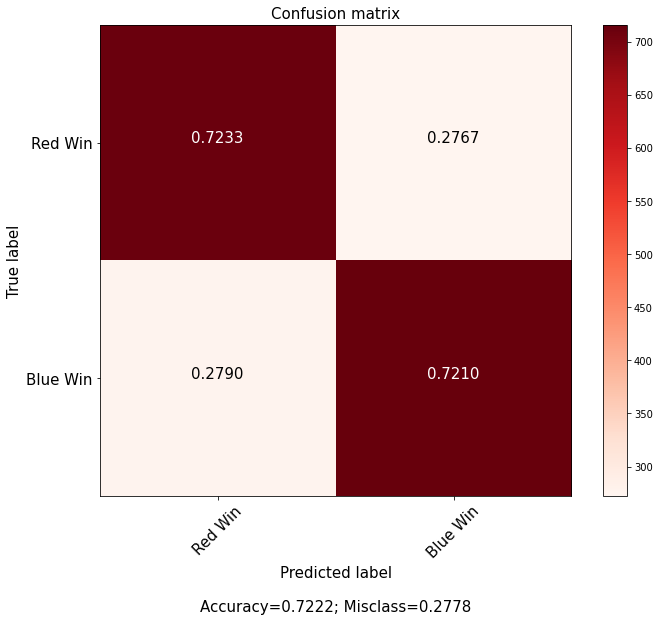

Gaussian Naive Bayes for 3. dataset Accuracy:0.727(+/-0.014).


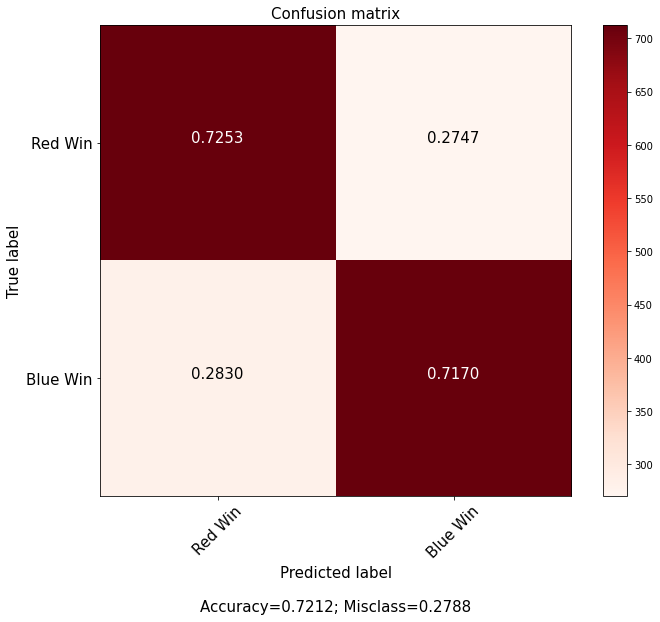

Gaussian Naive Bayes for 4. dataset Accuracy:0.623(+/-0.013).


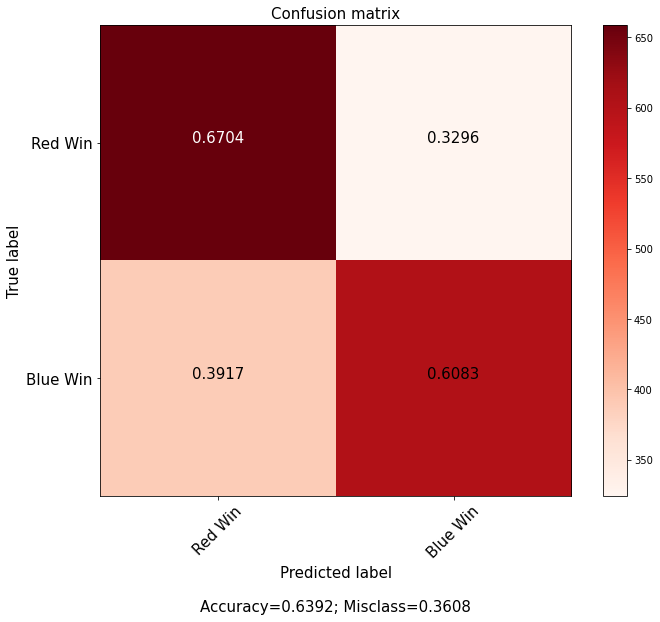

In [20]:
from sklearn.naive_bayes import GaussianNB

scores_model = []
for X in range(len(datasets)):  
    model = GaussianNB()
    scores = cross_val_score(model, datasets[X], y, cv=5)
    scores_model.append(round(scores.mean(),3))
    print(f'Gaussian Naive Bayes for {X+1}. dataset Accuracy:{scores.mean():.3f}(+/-{scores.std() * 2:.3f}).')
    
    X_train, X_test, y_train, y_test = train_test_split(datasets[X], y, test_size=0.2, random_state=42)
    
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    labels = ['Red Win', 'Blue Win']
#     cm = confusion_matrix(realvpred['y_real'].values, realvpred['y_pred'].values)
    cm = confusion_matrix(y_test, y_pred)
    plot_confusion_matrix(cm, labels, title='Confusion matrix', cmap=None, normalize=True)
    
scores_overall.append(scores_model)

### C-Support Vector Classification

C-Support Vector Classification for 1. dataset Accuracy:0.725(+/-0.014).


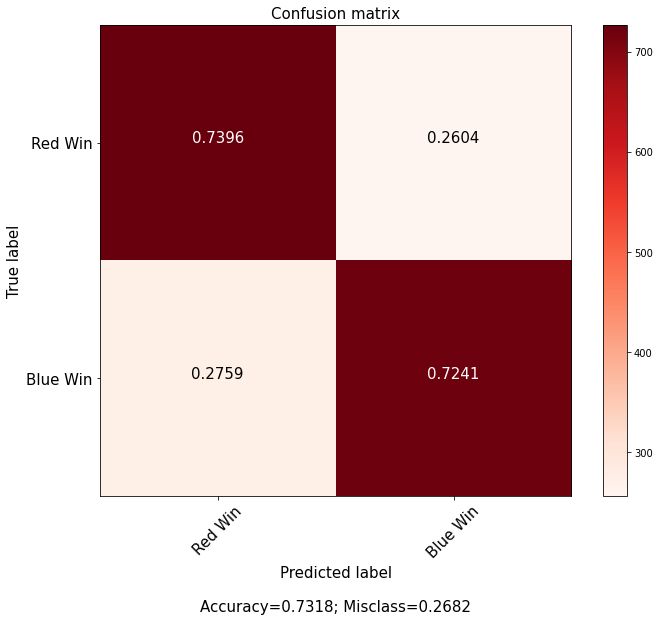

C-Support Vector Classification for 2. dataset Accuracy:0.726(+/-0.011).


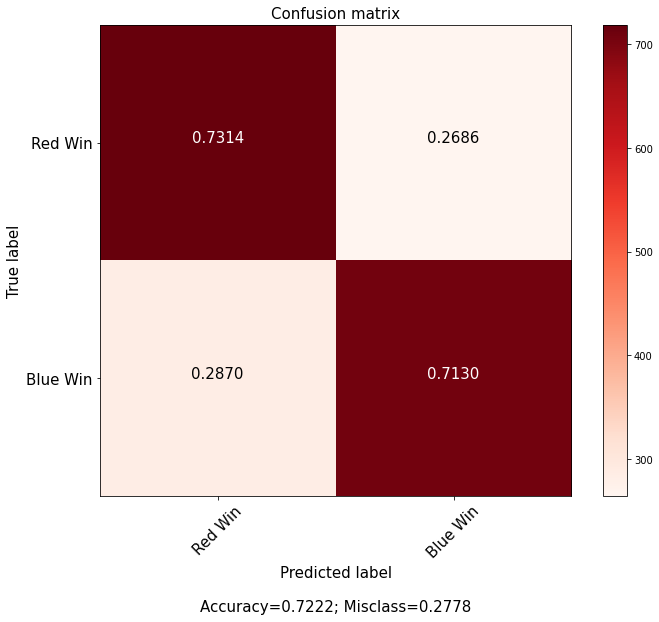

C-Support Vector Classification for 3. dataset Accuracy:0.727(+/-0.011).


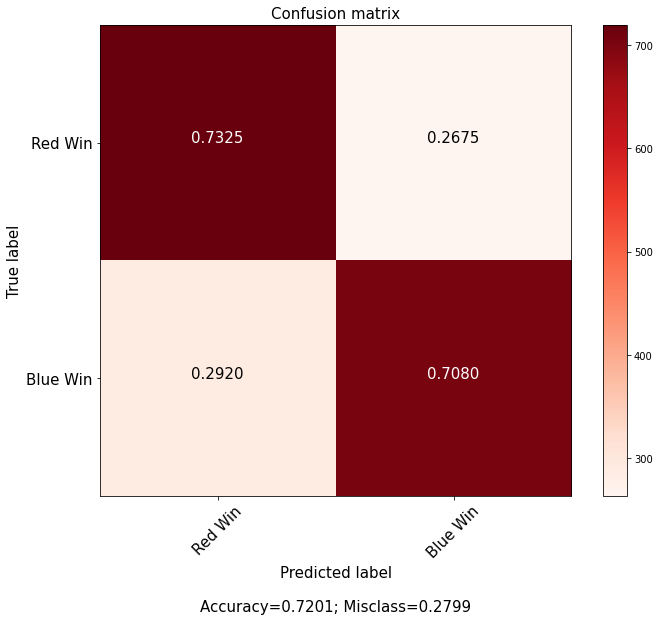

C-Support Vector Classification for 4. dataset Accuracy:0.628(+/-0.010).


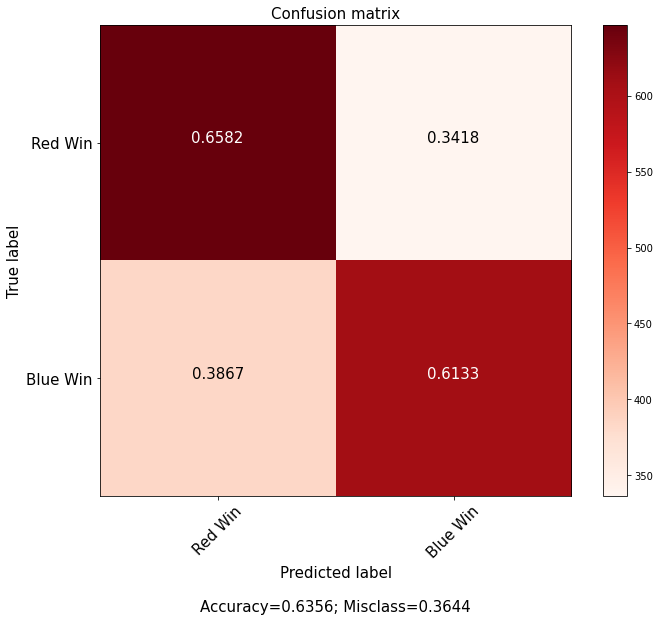

In [21]:
from sklearn.svm import SVC

scores_model = []
for X in range(len(datasets)):  
    model = SVC(probability=True)
    scores = cross_val_score(model, datasets[X], y, cv=5)
    scores_model.append(round(scores.mean(),3))
    print(f'C-Support Vector Classification for {X+1}. dataset Accuracy:{scores.mean():.3f}(+/-{scores.std() * 2:.3f}).')
    
    X_train, X_test, y_train, y_test = train_test_split(datasets[X], y, test_size=0.2, random_state=42)
    
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    labels = ['Red Win', 'Blue Win']
#     cm = confusion_matrix(realvpred['y_real'].values, realvpred['y_pred'].values)
    cm = confusion_matrix(y_test, y_pred)
    plot_confusion_matrix(cm, labels, title='Confusion matrix', cmap=None, normalize=True)
    
scores_overall.append(scores_model)

### K-Neighbors Classifier

K-Neighbors Classifier for 1. dataset Accuracy:0.684(+/-0.022).


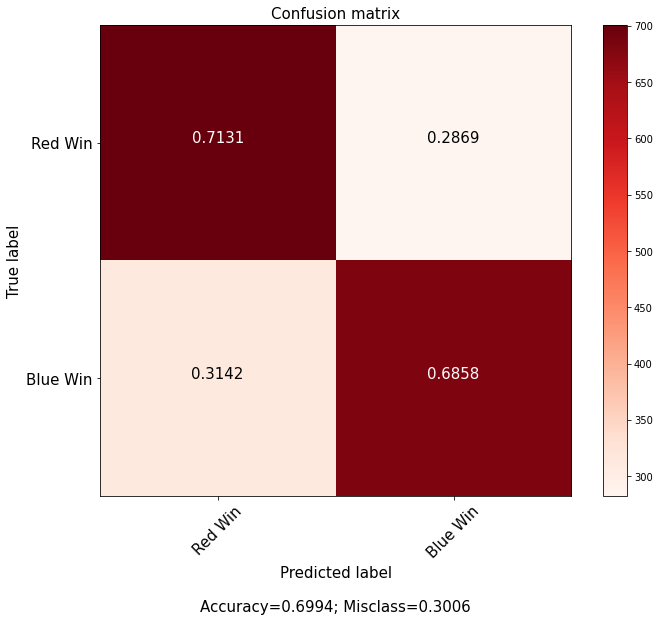

K-Neighbors Classifier for 2. dataset Accuracy:0.689(+/-0.018).


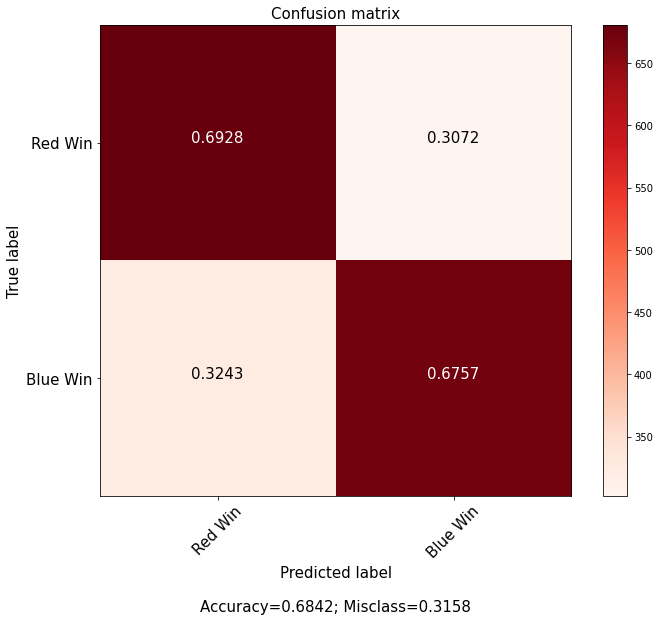

K-Neighbors Classifier for 3. dataset Accuracy:0.684(+/-0.009).


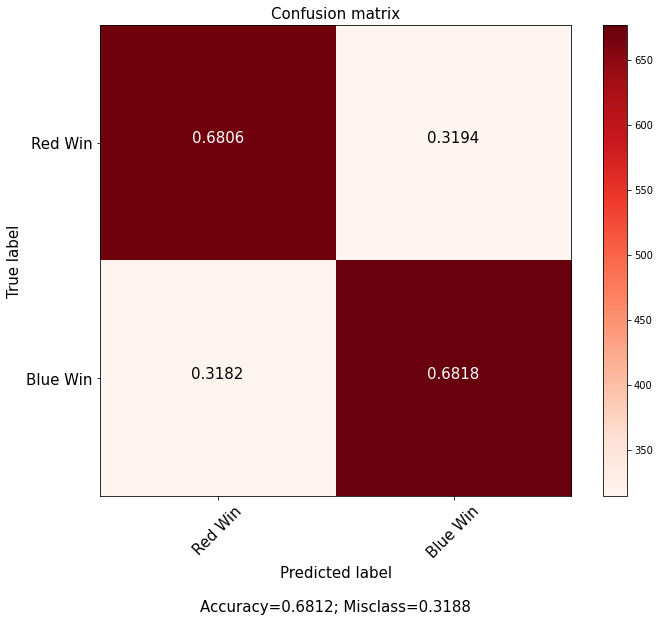

K-Neighbors Classifier for 4. dataset Accuracy:0.565(+/-0.125).


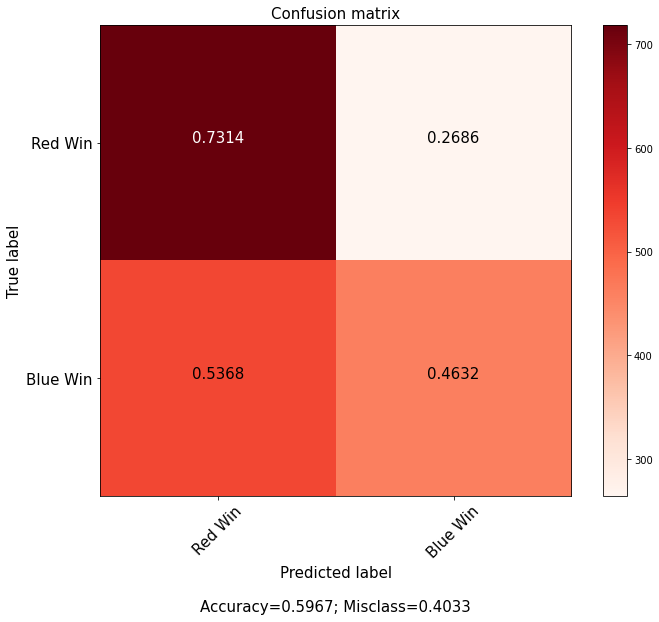

In [22]:
from sklearn import neighbors

scores_model = []
for X in range(len(datasets)):  
    model = neighbors.KNeighborsClassifier()
    scores = cross_val_score(model, datasets[X], y, cv=5)
    scores_model.append(round(scores.mean(),3))
    print(f'K-Neighbors Classifier for {X+1}. dataset Accuracy:{scores.mean():.3f}(+/-{scores.std() * 2:.3f}).')
    
    X_train, X_test, y_train, y_test = train_test_split(datasets[X], y, test_size=0.2, random_state=42)
    
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    labels = ['Red Win', 'Blue Win']
#     cm = confusion_matrix(realvpred['y_real'].values, realvpred['y_pred'].values)
    cm = confusion_matrix(y_test, y_pred)
    plot_confusion_matrix(cm, labels, title='Confusion matrix', cmap=None, normalize=True)

scores_overall.append(scores_model)

### Multi-layer Perceptron Classifier

Multi-layer Perceptron Classifier for 1. dataset Accuracy:0.728(+/-0.012).


C:\Users\user\.conda\envs\tensorflowgpu\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:585: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



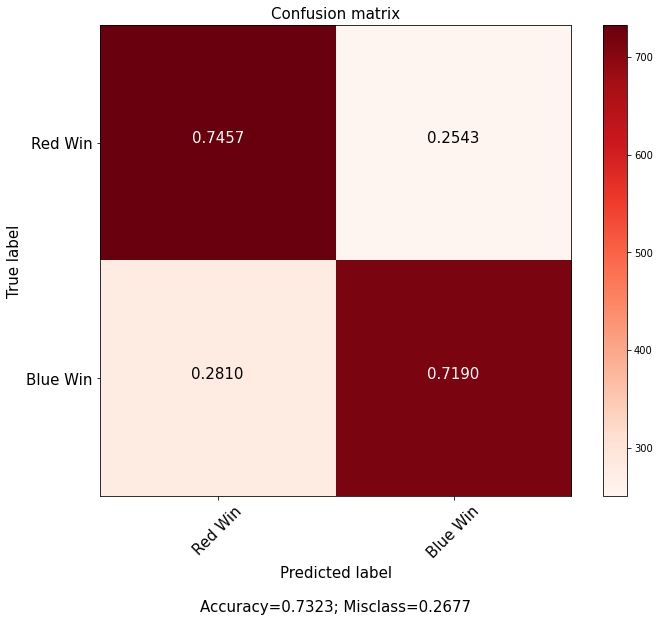

Multi-layer Perceptron Classifier for 2. dataset Accuracy:0.726(+/-0.011).


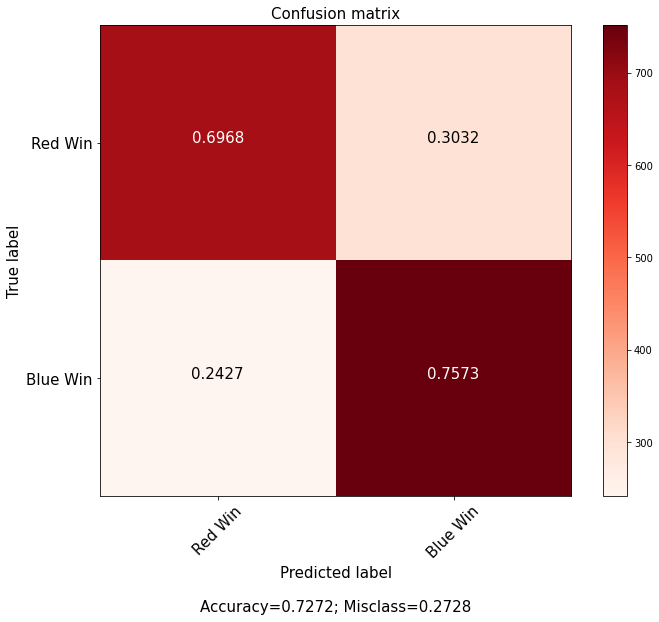

Multi-layer Perceptron Classifier for 3. dataset Accuracy:0.724(+/-0.014).


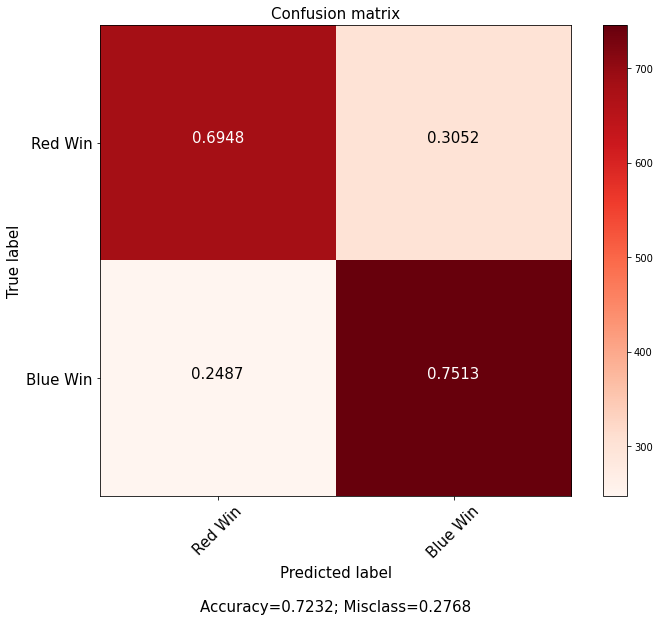

Multi-layer Perceptron Classifier for 4. dataset Accuracy:0.628(+/-0.010).


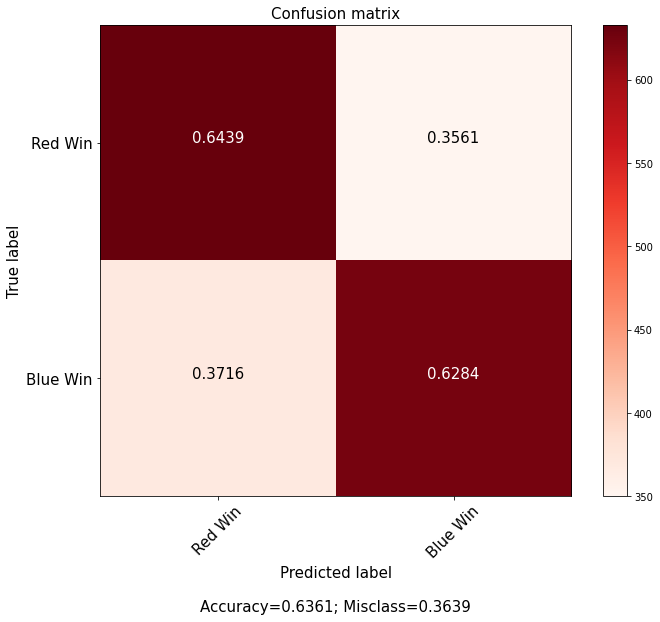

In [23]:
from sklearn.neural_network import MLPClassifier

from sklearn import neighbors

scores_model = []
for X in range(len(datasets)):  
    model = MLPClassifier()
    scores = cross_val_score(model, datasets[X], y, cv=5)
    scores_model.append(round(scores.mean(),3))
    print(f'Multi-layer Perceptron Classifier for {X+1}. dataset Accuracy:{scores.mean():.3f}(+/-{scores.std() * 2:.3f}).')
    
    X_train, X_test, y_train, y_test = train_test_split(datasets[X], y, test_size=0.2, random_state=42)
    
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    labels = ['Red Win', 'Blue Win']
#     cm = confusion_matrix(realvpred['y_real'].values, realvpred['y_pred'].values)
    cm = confusion_matrix(y_test, y_pred)
    plot_confusion_matrix(cm, labels, title='Confusion matrix', cmap=None, normalize=True)

scores_overall.append(scores_model)

In [48]:
traces = []
colors = ['rgb(255,0,0)', 'rgb(0,255,0)', 'rgb(0,0,255)', 'rgb(255,0,255)', 
          'rgb(200,200,0)', 'rgb(160,160,255)']
datasets_names = ['All features', 'd Cohen data', 'Correlation data', 'K-best and chi2']
model_names = ['Decision Tree Classifier', 'Random Forest Classifier', 'Gaussian Naive Bayes', 
              'C-Support Vector Classification', 'K-Neighbors Classifier', 'Multi-layer Perceptron Classifier']

for idx in range(len(scores_overall)):
    trace = go.Bar(x=datasets_names,
                   y=scores_overall[idx],
                   marker_color=colors[idx],
                   name=model_names[idx])
    traces.append(trace)
    
layout = go.Layout(title='Comparison the accuracy results',
                  legend=go.layout.Legend(y=0))
fig = go.Figure(data=traces, layout=layout)

iplot(fig)

### Deep neural network

In [51]:
from keras.models import Sequential, Model
from keras.layers import Dense, Activation, Dropout
from keras import activations
from keras.callbacks import EarlyStopping, ModelCheckpoint

Using TensorFlow backend.


In [52]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(df_scaled, y, test_size=0.2, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

print(f'There are {len(X_train)} game data in training data')
print(f'There are {len(X_val)} game data in validation data')
print(f'There are {len(X_test)} game data in testing data')

There are 6322 game data in training data
There are 1581 game data in validation data
There are 1976 game data in testing data


In [57]:
model = Sequential()

model.add(Dense(32, input_shape = (33,),activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(2, activation='softmax'))

optimizer = 'adam'
loss_function = 'sparse_categorical_crossentropy'

model.compile(loss=loss_function, optimizer=optimizer,  metrics=['accuracy'])
# train the model
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_5 (Dense)              (None, 32)                1088      
_________________________________________________________________
dropout_4 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_6 (Dense)              (None, 64)                2112      
_________________________________________________________________
dropout_5 (Dropout)          (None, 64)                0         
_________________________________________________________________
dense_7 (Dense)              (None, 128)               8320      
_________________________________________________________________
dropout_6 (Dropout)          (None, 128)               0         
_________________________________________________________________
dense_8 (Dense)              (None, 2)                

In [58]:
epochs = 100
history = model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs = epochs)

Train on 6322 samples, validate on 1581 samples
Epoch 1/100
6322/6322 [==============================] - 1s 200us/step - loss: 0.6088 - accuracy: 0.6634 - val_loss: 0.5564 - val_accuracy: 0.7160
Epoch 2/100
6322/6322 [==============================] - 1s 165us/step - loss: 0.5724 - accuracy: 0.7075 - val_loss: 0.5345 - val_accuracy: 0.7268
Epoch 3/100
6322/6322 [==============================] - 1s 164us/step - loss: 0.5659 - accuracy: 0.7131 - val_loss: 0.5312 - val_accuracy: 0.7331
Epoch 4/100
6322/6322 [==============================] - 1s 174us/step - loss: 0.5599 - accuracy: 0.7142 - val_loss: 0.5241 - val_accuracy: 0.7312
Epoch 5/100
6322/6322 [==============================] - 1s 162us/step - loss: 0.5546 - accuracy: 0.7203 - val_loss: 0.5225 - val_accuracy: 0.7388
Epoch 6/100
6322/6322 [==============================] - 1s 164us/step - loss: 0.5545 - accuracy: 0.7211 - val_loss: 0.5263 - val_accuracy: 0.7337
Epoch 7/100
6322/6322 [==============================] - 1s 169us/step

6322/6322 [==============================] - 1s 154us/step - loss: 0.5350 - accuracy: 0.7278 - val_loss: 0.5219 - val_accuracy: 0.7394
Epoch 57/100
6322/6322 [==============================] - 1s 153us/step - loss: 0.5332 - accuracy: 0.7305 - val_loss: 0.5316 - val_accuracy: 0.7306
Epoch 58/100
6322/6322 [==============================] - 1s 149us/step - loss: 0.5372 - accuracy: 0.7276 - val_loss: 0.5223 - val_accuracy: 0.7287
Epoch 59/100
6322/6322 [==============================] - 1s 149us/step - loss: 0.5329 - accuracy: 0.7267 - val_loss: 0.5233 - val_accuracy: 0.7261
Epoch 60/100
6322/6322 [==============================] - 1s 155us/step - loss: 0.5318 - accuracy: 0.7297 - val_loss: 0.5257 - val_accuracy: 0.7324
Epoch 61/100
6322/6322 [==============================] - 1s 154us/step - loss: 0.5332 - accuracy: 0.7265 - val_loss: 0.5211 - val_accuracy: 0.7299
Epoch 62/100
6322/6322 [==============================] - 1s 149us/step - loss: 0.5319 - accuracy: 0.7300 - val_loss: 0.5230 

In [72]:
index = [i for i in range(epochs)]

loss_val = go.Scatter(x = index,
                      y = history.history['val_loss'],
                      marker_color='red',
                      name = 'Validation Loss') 
loss = go.Scatter(x = index,
                  y = history.history['loss'],
                  marker_color='blue',
                  name = 'Loss')
layout_loss = go.Layout(title = go.layout.Title(text = 'Loss vs Validation Loss', x=0.45, font = go.layout.title.Font(size=25, color='black', family='Droid Serif”')),
                  plot_bgcolor='rgb(230,230,255)',
                  legend=go.layout.Legend(bordercolor='rgb(0,0,0)', bgcolor='rgb(256,200,256)', borderwidth=2),
                  xaxis = go.layout.XAxis(title_text='Epochs', titlefont_size=15),
                  yaxis = go.layout.YAxis(title_text='Loss [%]', titlefont_size=15, range=(0,0.65)),
                  margin=go.layout.Margin(l=0, r=0, t=50, b=50))

fig_loss = go.Figure(data=[loss, loss_val], layout = layout_loss)


acc = go.Scatter(x=index,
                y=history.history['accuracy'],
                marker=dict(color='blue'),
                name='Accuracy')
acc_val = go.Scatter(x=index,
                    y=history.history['val_accuracy'],
                    marker=dict(color='red'),
                    name='Validation Accuracy')
layout_acc = go.Layout(title=dict(text='Accuracy vs Validation Accuracy',x=0.45, font=dict(size=25, color='black', family='Droid Serif')),
                      plot_bgcolor='rgba(230,230,255,0.5)',
                       legend=dict(bordercolor='rgb(0,0,0)', bgcolor='rgb(256,200,256)', borderwidth=2),
                  xaxis = dict(title=dict(text='Epochs'), titlefont=dict(size=15)),
                  yaxis = dict(title=dict(text='Loss [%]'), titlefont=dict(size=15), range=(0.65,1)))

fig_acc = go.Figure(data=[acc, acc_val], layout = layout_acc)

iplot(fig_loss)
iplot(fig_acc)